<a href="https://colab.research.google.com/github/JorgeAnsotegui/TFM/blob/main/Entrenamiento/Entrenamiento_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Entrenar un modelo de segmentación personalizado utilizando Detectron2, con su propio Dataset

**Conectar Drive**

In [1]:
# Conectar Colab a Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Install Detectron2**


In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.3 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15737, done.
remote: Counting objects: 100% (460/460), done.
remote: Compressing objects: 100% (339/339), done.
remote: Total 15737 (delta 211), reused 305 (delta 112), pack-reused 15277
Receiving objects: 100% (15737/15737), 6.52 MiB | 10.46 MiB/s, done.
Resolving deltas: 100% (11327/11327), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.3 MB/s eta 0:0

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.3 ; cuda:  cu121
detectron2: 0.6


In [7]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

from detectron2.data.datasets import register_coco_instances

# Instanciar nuestro dataset


Instanciamos los dataset de entrenamiento, validación y prueba.


In [8]:
# Define the names of the datasets
datasets = ["my_dataset_train", "my_dataset_val", "my_dataset_test"]

# Unregister the datasets if they are already registered
for dataset in datasets:
    if dataset in DatasetCatalog.list():
        DatasetCatalog.remove(dataset)
    if dataset in MetadataCatalog.list():
        MetadataCatalog.remove(dataset)

# Define the root directory of your dataset
dataset_root = "/content/drive/MyDrive/TFM/dataset_Anot_Fix"

# Define the subdirectories for train, val, and test
subdirs = ["train", "val", "test"]

# Register the datasets
for subdir in subdirs:
    json_file = os.path.join(dataset_root, subdir, "annotations.json")
    image_dir = os.path.join(dataset_root, subdir, "images")
    register_coco_instances(f"my_dataset_{subdir}", {}, json_file, image_dir)


Extraemos los diccionarios de metadatos y conjuntos de datos para conjuntos de datos de entrenamiento, validación y prueba. Estos se pueden utilizar más adelante para otros fines, como visualización, entrenamiento de modelos, evaluación, etc. Veremos un ejemplo de visualización de inmediato.

In [9]:
train_metadata = MetadataCatalog.get("my_dataset_train")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train")

val_metadata = MetadataCatalog.get("my_dataset_val")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")

test_metadata = MetadataCatalog.get("my_dataset_test")
test_dataset_dicts = DatasetCatalog.get("my_dataset_test")

[07/10 11:05:03 d2.data.datasets.coco]: Loaded 143 images in COCO format from /content/drive/MyDrive/TFM/dataset_Anot_Fix/train/annotations.json
[07/10 11:05:03 d2.data.datasets.coco]: Loaded 49 images in COCO format from /content/drive/MyDrive/TFM/dataset_Anot_Fix/val/annotations.json
[07/10 11:05:03 d2.data.datasets.coco]: Loaded 45 images in COCO format from /content/drive/MyDrive/TFM/dataset_Anot_Fix/test/annotations.json


Comprobamos si el dataset no preseta problemas.

In [10]:
from matplotlib import pyplot as plt

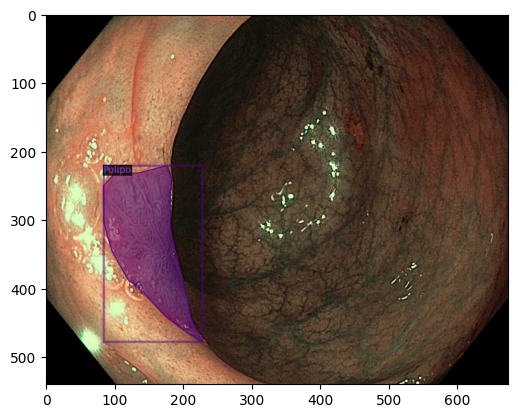

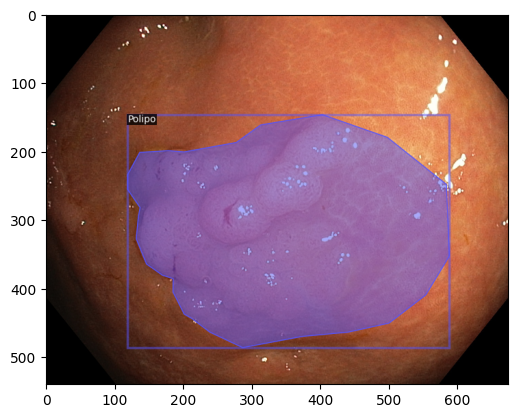

In [11]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image())
    plt.show()


# Entrenamos nuestro modelo

Now we are ready to train a Mask R-CNN model using the Detectron2 library. We start by setting up a configuration file (.cfg) for the model. The configuration file contains many details including the output directory path, training dataset information, pre-trained weights, base learning rate, maximum number of iterations, etc.

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg() # Crea una instancia de la configuración predeterminada de Detectron2.
cfg.OUTPUT_DIR = "/content/drive/MyDrive/TFM/models/Detectron2_Models" # Establece el directorio donde se guardarán los resultados del entrenamiento, como los modelos entrenados y los archivos de registro.
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")) # Carga una configuración predefinida. Esta configuración se fusiona con la configuración actual.
cfg.DATASETS.TRAIN = ("my_dataset_train",) # No hay que olvidarse de la coma, para que sea un tuple
cfg.DATASETS.TEST = ("my_dataset_test",) # No hay que olvidarse de la coma, para que sea un tuple
cfg.DATALOADER.NUM_WORKERS = 2 # Establece el número de procesos de trabajo utilizados por el dataloader para cargar los datos. Un número mayor puede acelerar la carga de datos, pero también requerirá más memoria y CPU.
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # El entrenamiento comienza a partir de un modelo que ya tiene pesos preentrenados en COCO
cfg.SOLVER.IMS_PER_BATCH = 2  # Este es el número de imágenes procesadas simultáneamente en cada paso de entrenamiento.
cfg.SOLVER.BASE_LR = 0.00025  # Establece la tasa de aprendizaje base. Este es un hiperparámetro crucial que controla qué tanto se ajustan los pesos del modelo en cada paso de entrenamiento.
cfg.SOLVER.MAX_ITER = 1000 # Establece el número máximo de iteraciones
cfg.SOLVER.STEPS = [] # Especifica cuándo reducir la tasa de aprendizaje durante el entrenamiento
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256 # Por defecto 512. Establece el tamaño del lote por imagen para los cabezales de ROI. Este es el número de muestras de región de interés por imagen utilizadas para el entrenamiento de los cabezales del modelo.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Especifiaca el número de clases, no tiene en cuenta el fondo. Polipo

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) # Crea una instancia de DefaultTrainer con la configuración especificada (cfg). DefaultTrainer es una clase que maneja el ciclo de entrenamiento completo, incluyendo la carga de datos, el ajuste del modelo, y la evaluación.
trainer.resume_or_load(resume=False) # Carga un modelo preentrenado si está disponible (resume el entrenamiento) o inicia el entrenamiento desde cero si no hay un modelo preentrenado disponible


[07/03 15:43:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:00, 182MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


**Entrenamiento**

In [ ]:
trainer.train() #Start the training process

[07/03 15:43:20 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[07/03 15:43:33 d2.utils.events]:  eta: 0:07:04  iter: 19  total_loss: 0.7298  loss_cls: 0.6886  loss_box_reg: 0  loss_mask: 0  loss_rpn_cls: 0.01158  loss_rpn_loc: 0.008139    time: 0.4305  last_time: 0.3696  data_time: 0.0927  last_data_time: 0.0581   lr: 4.9953e-06  max_mem: 2144M
[07/03 15:43:46 d2.utils.events]:  eta: 0:06:56  iter: 39  total_loss: 0.5847  loss_cls: 0.5645  loss_box_reg: 0  loss_mask: 0  loss_rpn_cls: 0.01152  loss_rpn_loc: 0.00728    time: 0.4409  last_time: 0.6455  data_time: 0.0600  last_data_time: 0.2440   lr: 9.9902e-06  max_mem: 2144M
[07/03 15:43:54 d2.utils.events]:  eta: 0:06:44  iter: 59  total_loss: 0.4088  loss_cls: 0.3849  loss_box_reg: 0  loss_mask: 0  loss_rpn_cls: 0.007411  loss_rpn_loc: 0.007343    time: 0.4409  last_time: 0.3977  data_time: 0.0961  last_data_time: 0.0421   lr: 1.4985e-05  max_mem: 2144M
[07/03 15:44:03 d2.utils.events]:  eta: 0:06:31  iter: 79  total_loss: 0.2323  loss_cls: 0.221  loss_box_reg: 0  loss_mask: 0  loss_rpn_cls: 0.00

# Miramos las metricas usando TensorBoard

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
# %reload_ext tensorboard  #Reload in case you have already loaded it once

%tensorboard --logdir /content/drive/MyDrive/TFM/models/Detectron2_Models --port 6007


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 8438), started 0:10:23 ago. (Use '!kill 8438' to kill it.)

<IPython.core.display.Javascript object>

Guardamos el fichero de configuracion por si acaso

In [ ]:
import yaml
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/TFM/models/Detectron2_Models/model_1k_iter.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

#Save the model weights with a different name so we don't accidentally overwrite our model.
os.rename(os.path.join(cfg.OUTPUT_DIR, "model_final.pth"), os.path.join(cfg.OUTPUT_DIR, "model_1k_iter.pth"))

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/TFM/models/Detectron2_Models/model_final.pth' -> '/content/drive/MyDrive/TFM/models/Detectron2_Models/model_1k_iter.pth'

# Verificamos la eficacia del modelo entrenado

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_1k_iter.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.001   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[07/03 16:18:19 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TFM/models/Detectron2_Models/model_1k_iter.pth ...


**Verificar la segmentación en imágenes aleatorias de prueba** <p>
Pero primero, necesitamos registrar nuestro conjunto de datos de prueba en instancias de COCO.

/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  x = F.conv2d(


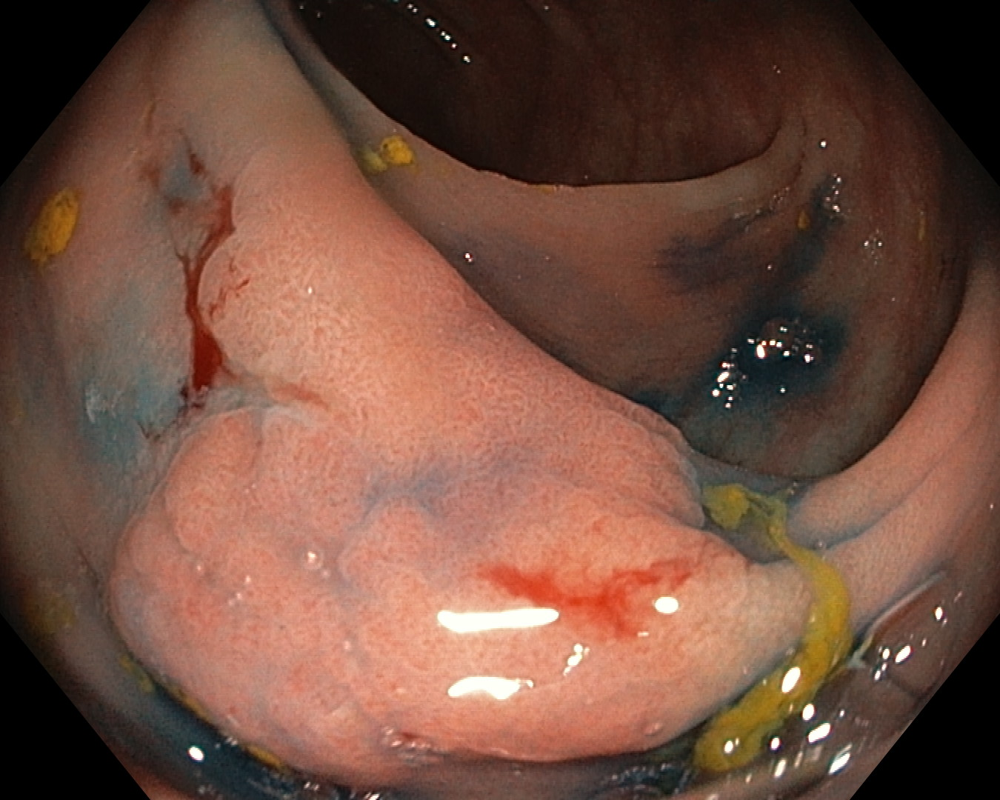

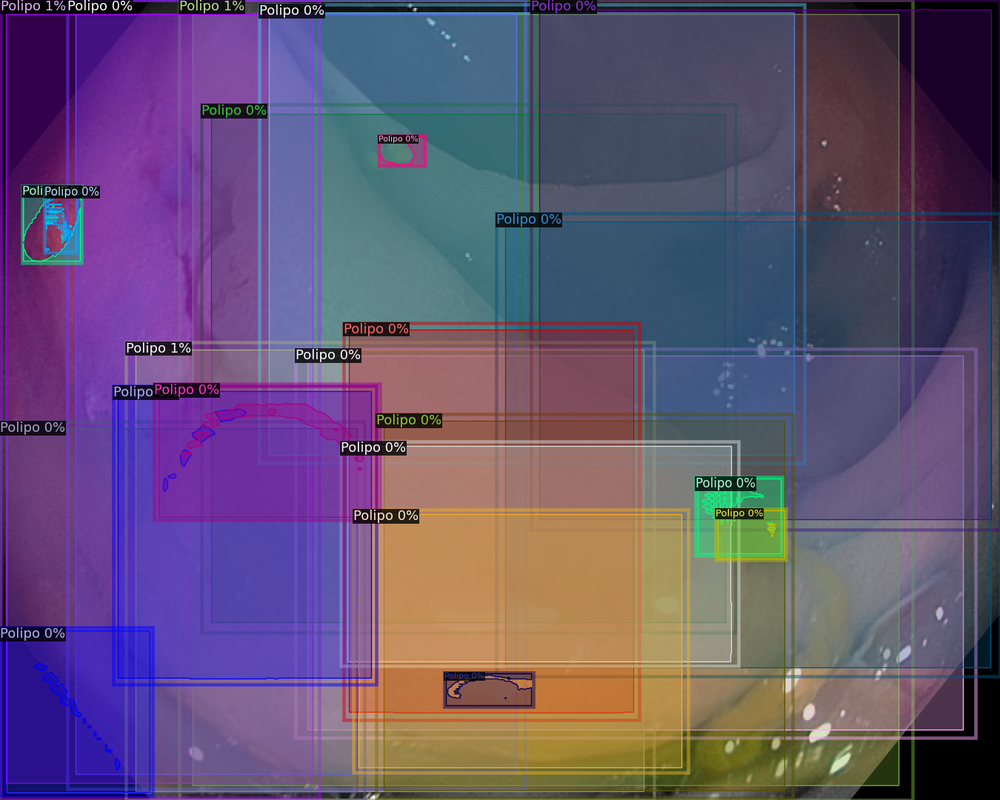

In [ ]:
from detectron2.utils.visualizer import ColorMode
import random
import cv2
from google.colab.patches import cv2_imshow

# Asegúrate de que test_dataset_dicts y test_metadata estén definidos en tu entorno

for d in random.sample(test_dataset_dicts, 1):    # selecciona el número de imágenes para mostrar
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=1,
                   instance_mode=ColorMode.IMAGE_BW  # elimina los colores de los píxeles no segmentados
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    # Muestra la imagen original y la salida
    cv2_imshow(im)
    cv2_imshow(out.get_image()[:, :, ::-1])


Puedes aplicar tu propio umbral para filtrar objetos. Pero recuerda que el umbral mínimo será el número establecido en la configuración cfg. Verifica esta línea arriba:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

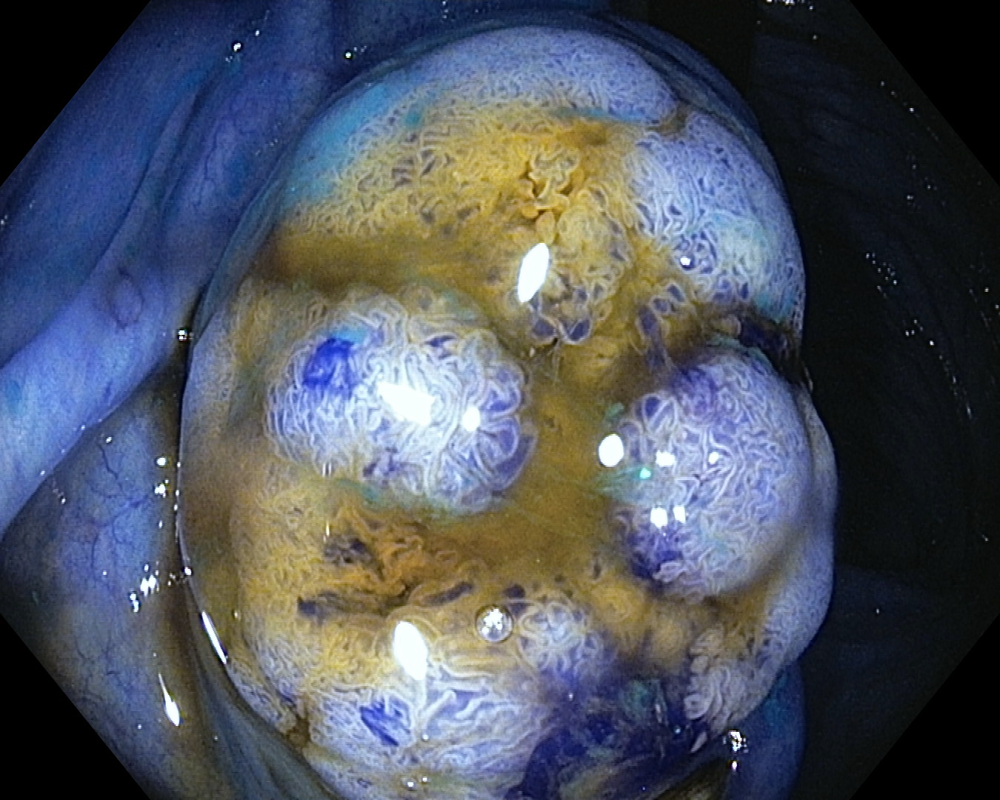

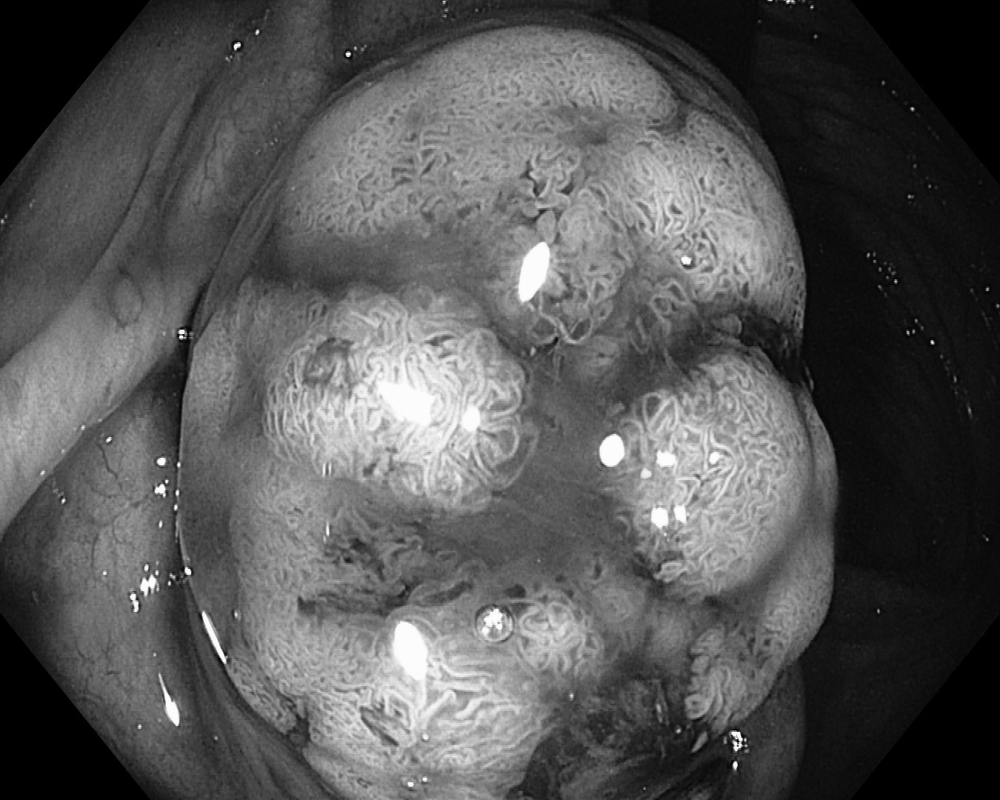

In [ ]:
for d in random.sample(test_dataset_dicts, 1):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs2 = predictor(im)

    # Perform prediction on the tile using your trained model
    outputs2 = predictor(im)

# Get the confidence scores
    scores = outputs2["instances"].scores

# Define your custom threshold
    threshold = 0.5

# Filter instances based on confidence threshold
    filtered_indices = [i for i, score in enumerate(scores) if score > threshold]

# Update the instances in the outputs
    outputs2["instances"] = outputs2["instances"][filtered_indices]

    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=1,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs2["instances"].to("cpu"))
    cv2_imshow(im[:, :, ::-1])
    cv2_imshow(out.get_image()[:, :, ::-1])



In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("my_dataset_test", output_dir="./output")
test_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, test_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[07/03 16:18:41 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [07/03 16:18:41 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/03 16:18:41 d2.data.datasets.coco]: Loaded 45 images in COCO format from /content/drive/MyDrive/TFM/dataset_Detectron2_V3/test/annotations.json
[07/03 16:18:41 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/03 16:18:41 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/03 16:18:41 d2.data.common]: Serializing 45 elements to byte tensors and concatenating them all ...
[07/03 16:18:41 d2.data.common]: Serialized dataset takes 0.04 MiB
[07/03 16:18:41 d2.evaluation.evaluator]: Start inference on 45 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  x = F.conv2d(
/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  x = F.conv2d(
/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinaliz

[07/03 16:18:44 d2.evaluation.evaluator]: Inference done 11/45. Dataloading: 0.0017 s/iter. Inference: 0.1153 s/iter. Eval: 0.0975 s/iter. Total: 0.2145 s/iter. ETA=0:00:07


/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  x = F.conv2d(
/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  x = F.conv2d(
/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  x = F.conv2d(
/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed wi

[07/03 16:18:50 d2.evaluation.evaluator]: Inference done 39/45. Dataloading: 0.0023 s/iter. Inference: 0.1131 s/iter. Eval: 0.0794 s/iter. Total: 0.1949 s/iter. ETA=0:00:01


/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  x = F.conv2d(
/content/detectron2/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  x = F.conv2d(


[07/03 16:18:51 d2.evaluation.evaluator]: Total inference time: 0:00:08.342122 (0.208553 s / iter per device, on 1 devices)
[07/03 16:18:51 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.113621 s / iter per device, on 1 devices)
[07/03 16:18:51 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[07/03 16:18:51 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[07/03 16:18:51 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average

Entendiendo la métrica de precisión promedio:
<p>

**AP** = Precisión Promedio <br>

**AP50** = AP calculada usando un umbral de IoU de 0.5. En nuestro caso, obtuvimos AP50 como 72, lo que significa que nuestro modelo está funcionando bien con este umbral. <br>

**APs** (objetos pequeños): Nuestra puntuación es 32, lo que sugiere que el rendimiento del modelo en objetos pequeños es inferior al rendimiento general. <br>

**APm** (objetos medianos): Nuestra puntuación es 50, lo que sugiere que nuestro modelo tiene un mejor rendimiento en objetos medianos. <br>

**APl** (objetos grandes): Obtenemos NaN. Podría significar que no tenemos objetos grandes detectados en nuestras predicciones.

# Optimización de los Hyperparametros con Optuna

In [ ]:
import optuna
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os
import datetime

# Función para crear la estructura de directorios del experimento
def create_experiment_dir(root_dir, experiment_name):
    experiment_dir = os.path.join(root_dir, experiment_name)
    os.makedirs(experiment_dir, exist_ok=True)
    os.makedirs(os.path.join(experiment_dir, 'logs'), exist_ok=True)
    os.makedirs(os.path.join(experiment_dir, 'models'), exist_ok=True)
    return experiment_dir

# Función de entrenamiento con Detectron2
def train(cfg, max_iter, base_lr):
    cfg.SOLVER.MAX_ITER = max_iter
    cfg.SOLVER.BASE_LR = base_lr

    # Crear el entrenador y entrenar el modelo
    trainer = DefaultTrainer(cfg)
    trainer.resume_or_load(resume=False)
    trainer.train()

    # Aquí puedes retornar la métrica que deseas optimizar
    # En este caso, retornaremos el AP (Average Precision) después del entrenamiento
    metrics = trainer.test(cfg, trainer.model)
    ap = metrics['bbox']['AP']
    return ap

# Función objetivo para Optuna
def objective(trial):
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
    cfg.DATASETS.TRAIN = ("my_dataset_train",)
    cfg.DATASETS.TEST = ("my_dataset_test",)
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

    # Generar un nombre único para el experimento basado en la fecha y hora actual
    experiment_name = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    cfg.OUTPUT_DIR = create_experiment_dir("/content/drive/MyDrive/TFM/models/Detectron2_Models", experiment_name)

    # Definir los hiperparámetros para optimizar
    max_iter = trial.suggest_int('max_iter', 500, 3000, step=500)
    base_lr = trial.suggest_loguniform('base_lr', 1e-5, 1e-3)

    # Llamar a la función de entrenamiento con los hiperparámetros y obtener la métrica
    ap = train(cfg, max_iter, base_lr)

    return ap

# Crear un estudio de Optuna y optimizar
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)  # Realiza 10 iteraciones de optimización

best_params = study.best_params
print("Mejores hiperparámetros encontrados:", best_params)


ModuleNotFoundError: No module named 'optuna'